# Variables With Prediction Modelling

Variables with future predictions are used to predict the Absorbance.

The variables are:
* Air temperature
* Daily Cumulated Rainfall
* Water Temperature
* Flow River (River Discharge in the Projections folder)


3 different models are used:
* linear regression
* random forest
* neural network

In [1]:
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

# Models
import xgboost as xgb
from lightgbm import LGBMRegressor
from sklearn.neural_network import MLPRegressor

# Utils
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import KFold
from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve

# Hyperparameter Optimization
import optuna

# MAPiE
from mapie.regression import MapieQuantileRegressor, MapieRegressor
from mapie.metrics import regression_coverage_score

# Define paths

In [135]:
data_folder = os.path.join("..", "data")

projection_folder = os.path.join(data_folder, "future_projections")
processed_projections_folder = os.path.join(
    projection_folder, "processed"
)

interpolated_projections_folder = os.path.join(
    projection_folder, "interpolated"
)

raw_data_folder = os.path.join(data_folder, "raw_data")

# Load dataset

In [3]:
full_df = pd.read_excel(
    os.path.join(raw_data_folder, "raw_full_dataset.xlsx")
)

In [4]:
full_df

,DateTime,nitrate,pH,turbidity,Ammonium,dissolvedoxygen,watertemperature,Conductivity,redoxpotential,ABS254,cumulated_rainfall_24h,flowriver,environmental_temperature
0,2012-08-29,5.54,8.31,3.42,0.01,4.71,28.10,1144.98,220.47,9.07,0.0,100.82,27.02
1,2012-08-30,5.56,8.29,3.10,0.02,4.75,27.57,1205.67,225.81,15.13,0.4,97.40,22.49
2,2012-08-31,5.51,8.31,3.60,0.04,5.08,26.37,1237.20,229.83,15.95,0.0,95.59,21.03
3,2012-09-01,5.49,8.40,4.00,0.06,5.68,25.04,1254.15,231.82,NaN,0.0,94.97,17.81
4,2012-09-02,5.39,8.43,3.97,0.15,5.98,24.75,1244.10,234.80,15.10,0.0,95.48,19.43
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4045,2023-09-26,7.56,8.30,3.96,0.03,5.46,25.95,1628.49,227.69,3.97,0.0,83.50,20.50
4046,2023-09-27,7.28,8.29,4.16,0.02,5.33,26.37,1610.67,227.02,3.81,0.0,81.17,21.76
4047,2023-09-28,7.34,8.27,3.80,0.02,5.23,26.60,1602.33,228.25,3.76,0.0,81.42,22.17
4048,2023-09-29,7.64,8.25,3.89,0.03,5.17,26.73,1613.81,230.54,4.18,0.0,80.71,22.03


In [5]:
full_df.rename(
    columns={
        "flowriver": "Flow River",
        "cumulated_rainfall_24h": "Daily Cumulated Rainfall",
        "environmental_temperature": "Air Temperature",
        "nitrate": "Nitrate",
        "dissolvedoxygen": "Dissolved Oxygen",
        "turbidity": "Turbidity",
        "watertemperature": "Water Temperature",
        "redoxpotential": "Redox Potential",
        "ABS254": "Absorbance 254nm",
    },
    inplace=True,
)

In [6]:
full_df.isna().sum()

DateTime                      0
Nitrate                     176
pH                           99
Turbidity                   218
Ammonium                    413
Dissolved Oxygen            325
Water Temperature            86
Conductivity                141
Redox Potential             273
Absorbance 254nm            551
Daily Cumulated Rainfall     10
Flow River                   46
Air Temperature               1
dtype: int64

In [7]:
full_df = full_df.dropna()

# Remove Variables with no future projections

They are:
- Nitrate
- pH
- Ammonium
- Dissolved Oxygen
- Conductivity
- Redox Potential

In [8]:
full_df.drop(
    columns=[
        "Nitrate",
        "pH",
        "Ammonium",
        "Dissolved Oxygen",
        "Conductivity",
        "Redox Potential",
        "Turbidity",
    ],
    inplace=True,
)

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_74679/670764935.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_df.drop(


## Take the Monthly Average

In [9]:
full_df["Year"] = full_df["DateTime"].dt.year
full_df["Month"] = full_df["DateTime"].dt.month

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_74679/1583524510.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_df["Year"] = full_df["DateTime"].dt.year
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_74679/1583524510.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_df["Month"] = full_df["DateTime"].dt.month


In [10]:
# take the monthly average
monthly_avg_df = full_df.groupby(["Year", "Month"]).mean().reset_index()

In [11]:
full_df = monthly_avg_df

In [12]:
full_df["Season"] = full_df["Month"].apply(
    lambda x: "Winter"
    if x in [12, 1, 2]
    else "Spring"
    if x in [3, 4, 5]
    else "Summer"
    if x in [6, 7, 8]
    else "Autumn"
)

# convert Season to integer
full_df["Season"] = full_df["Season"].apply(
    lambda x: 1
    if x == "Winter"
    else 2
    if x == "Spring"
    else 3
    if x == "Summer"
    else 4
)

full_df["Timestamp"] = full_df["DateTime"].apply(
    lambda x: x.timestamp()
)

# XGBoost

### Split Data

In [13]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Season", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm", "Water Temperature"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [14]:
# add polynomial features
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(2)

X_poly = poly.fit_transform(
    X[X.columns.difference(["DateTime"] + further_features)]
)

X_poly = pd.DataFrame(
    X_poly,
    columns=poly.get_feature_names_out(
        X.columns.difference(["DateTime"] + further_features)
    ),
)

X_poly["DateTime"] = X["DateTime"].values

X_poly[further_features] = X[further_features].values

In [15]:
# split data such that 2022 and 2023 are test data
X_train = X_poly[X_poly["DateTime"] < "2021-01-01"]
X_test = X_poly[X_poly["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [16]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

In [17]:
%%script false --no-raise-error
# split data such that 2022 and 2023 are test data
X_train = X[X['DateTime'] < '2021-01-01']
X_test = X[X['DateTime'] >= '2021-01-01']

y_train = y[y['DateTime'] < '2021-01-01']
y_test = y[y['DateTime'] >= '2021-01-01']

In [18]:
%%script false --no-raise-error
X_train_fit = X_train[X_train.columns.difference(['DateTime'])]
X_test_fit = X_test[X_test.columns.difference(['DateTime'])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [19]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

#### Learning and Validation Curves

In [20]:
def learning_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    train_sizes=np.linspace(0.3, 1.0, 5),
):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator,
        X,
        y,
        train_sizes=train_sizes,
        cv=cv,
        scoring="neg_mean_squared_error",
    )

    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    validation_scores_mean = np.sqrt(
        -np.mean(validation_scores, axis=1)
    )
    validation_scores_std = np.sqrt(np.std(validation_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.plot(
        train_sizes,
        train_scores_mean,
        "o-",
        color="r",
        label="Training error",
    )
    plt.plot(
        train_sizes,
        validation_scores_mean,
        "o-",
        color="g",
        label="Validation error",
    )
    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes,
        validation_scores_mean - validation_scores_std,
        validation_scores_mean + validation_scores_std,
        alpha=0.1,
        color="g",
    )

    plt.rcParams["font.size"] = 10
    plt.ylabel("RMSE", fontsize=14)
    plt.xlabel("Training set size", fontsize=14)
    title = title
    plt.title(title, fontsize=18, y=1.03)
    plt.legend()
    plt.show()

In [21]:
def validation_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    param_name=None,
    param_range=None,
    fit_params=None,
):
    train_scores, test_scores = validation_curve(
        estimator,
        X,
        y,
        param_name=param_name,
        param_range=param_range,
        fit_params=fit_params,
        cv=cv,
        scoring="neg_mean_squared_error",  #'roc_auc'
        n_jobs=4,
    )
    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    test_scores_mean = np.sqrt(-np.mean(test_scores, axis=1))
    test_scores_std = np.sqrt(np.std(test_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.title(title, fontsize=20)
    plt.xlabel(param_name, fontsize=14)
    plt.ylabel("Score", fontsize=14)
    lw = 2
    plt.plot(
        param_range,
        train_scores_mean,
        label="Training score",
        color="darkorange",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.2,
        color="darkorange",
        lw=lw,
    )
    plt.plot(
        param_range,
        test_scores_mean,
        label="Cross-validation score",
        color="navy",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.2,
        color="navy",
        lw=lw,
    )
    plt.rcParams["font.size"] = 10
    plt.legend(loc="best")
    # plt.ylim(4, 8)
    plt.grid(visible=True)
    plt.show()

    # print param value with lowest test score
    print(
        f"{param_name} with lowest score:",
        param_range[np.argmin(test_scores_mean)],
    )

In [22]:
model = xgb.XGBRegressor(
    objective="reg:squarederror",
    booster="gblinear",
    random_state=42,
)

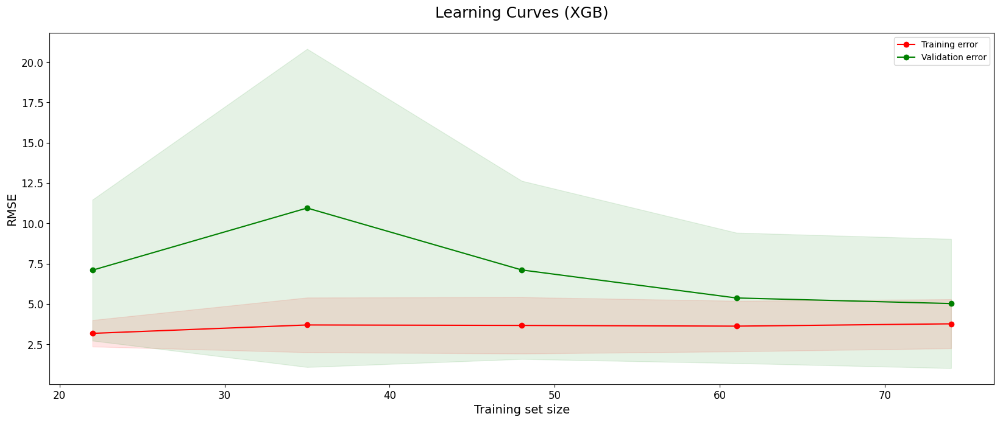

In [23]:
title = "Learning Curves (XGB)"
learning_curves(
    model, title, X_train_fit, y_train_fit["Absorbance 254nm"], cv=5
)

In [24]:
param_name = "n_estimators"
param_range = np.arange(1, 100, 5)

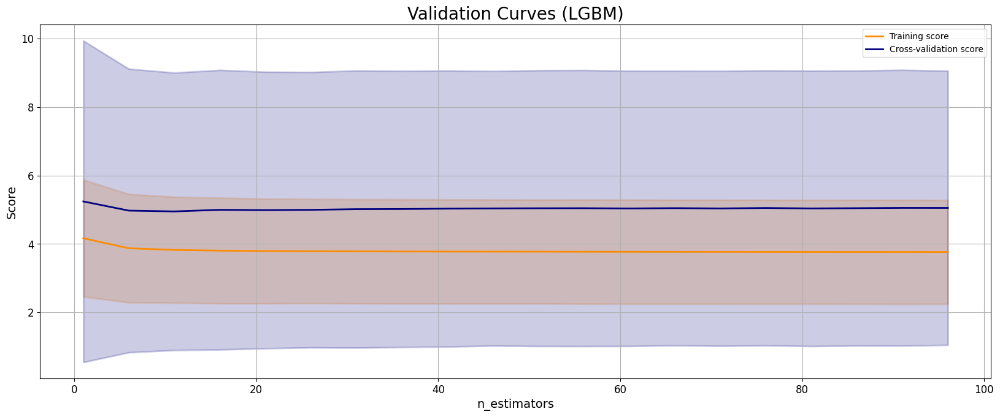

n_estimators with lowest score: 11


In [25]:
title = "Validation Curves (LGBM)"
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [26]:
param_name = "learning_rate"
param_range = np.logspace(-3, -1, 10)

In [27]:
np.logspace(-3, -1, 10)

array([0.001     , 0.0016681 , 0.00278256, 0.00464159, 0.00774264,
       0.0129155 , 0.02154435, 0.03593814, 0.05994843, 0.1       ])

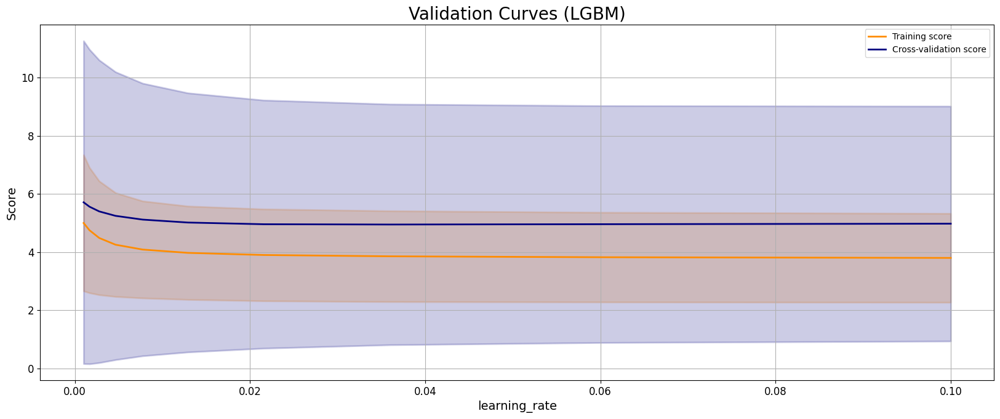

learning_rate with lowest score: 0.03593813663804626


In [28]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [29]:
param_name = "eta"
param_range = np.logspace(-5, 0, 10)

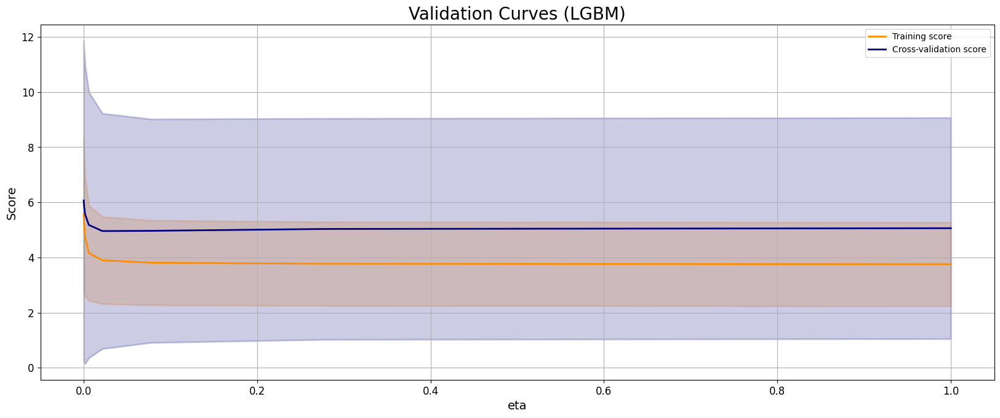

eta with lowest score: 0.021544346900318846


In [30]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [31]:
param_name = "reg_alpha"
param_range = np.logspace(-8, 0, 10)

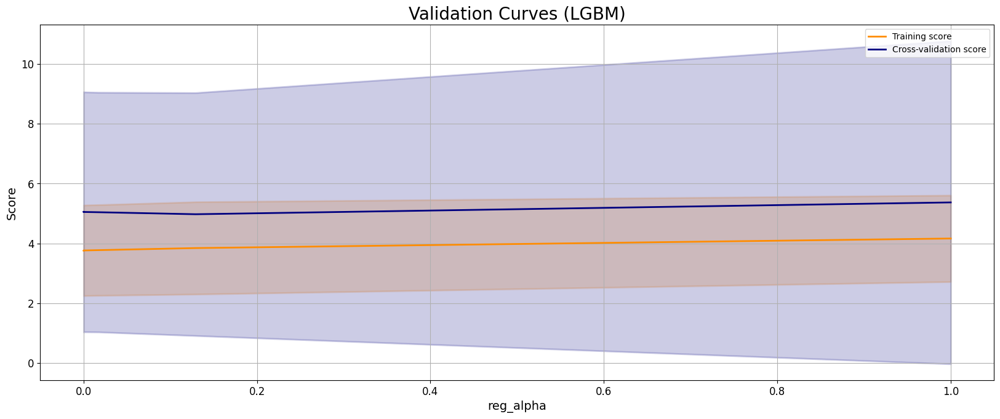

reg_alpha with lowest score: 0.12915496650148828


In [32]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [33]:
param_name = "reg_lambda"
param_range = np.logspace(-5, -1, 10)

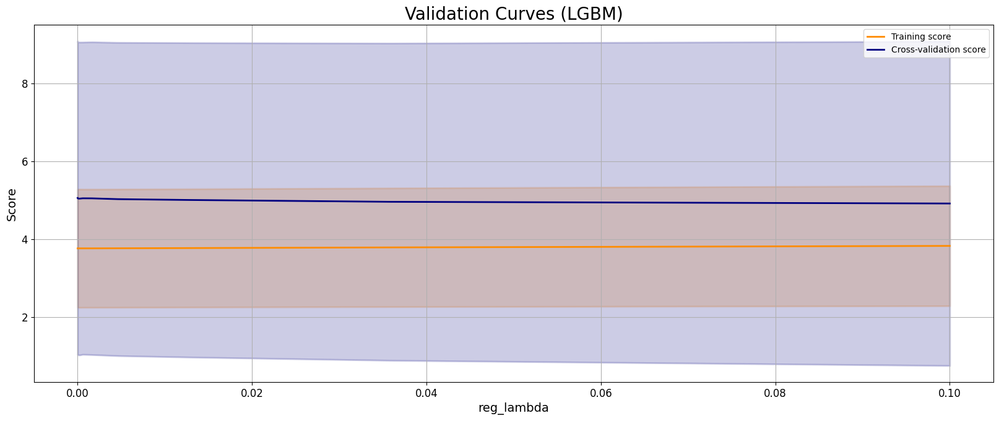

reg_lambda with lowest score: 0.1


In [34]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [35]:
param_name = "scale_pos_weight"
param_range = np.logspace(-5, 0, 10)

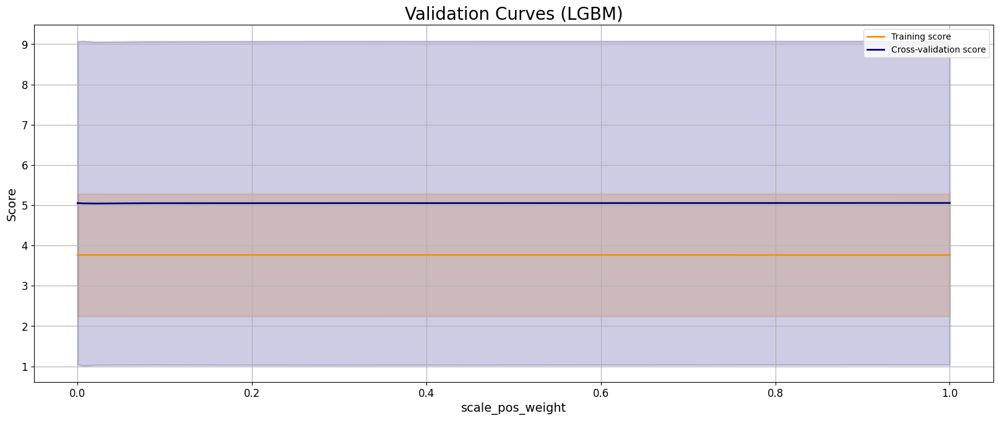

scale_pos_weight with lowest score: 0.021544346900318846


In [36]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [37]:
param_name = "base_score"
param_range = np.linspace(0.1, 10, 10)

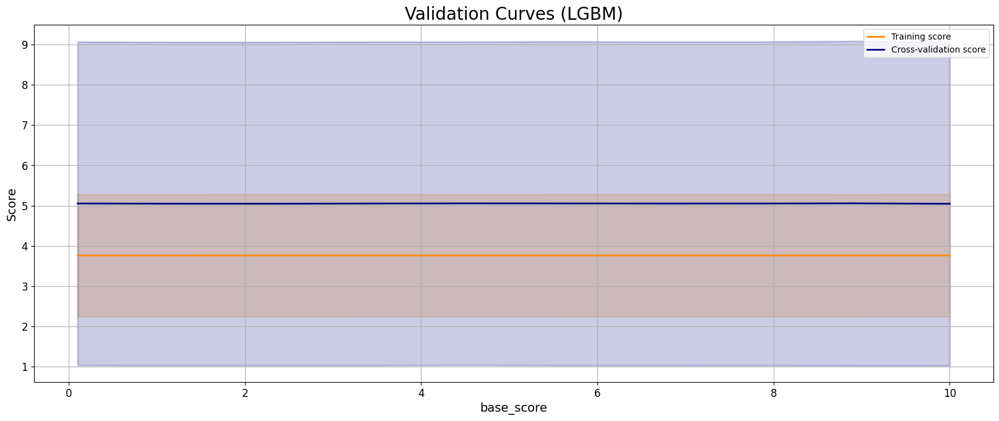

base_score with lowest score: 10.0


In [38]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [39]:
param_name = "importance_type"
param_range = ["gain", "weight", "cover", "total_gain", "total_cover"]

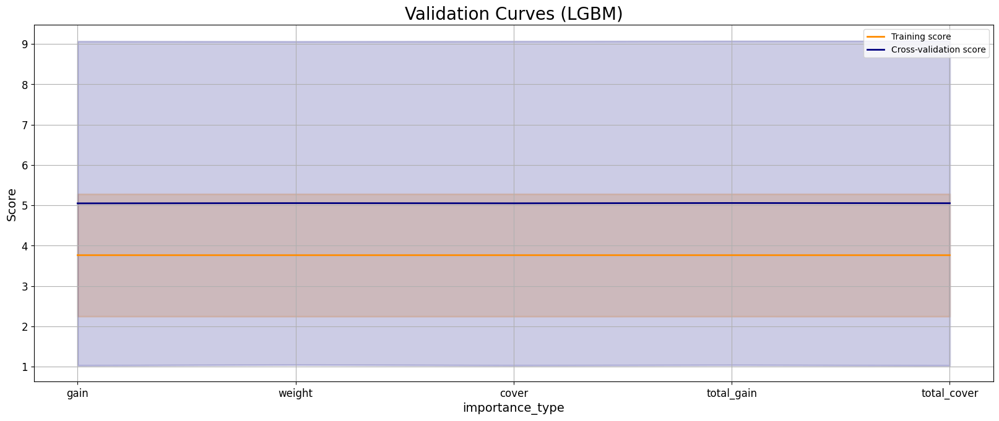

importance_type with lowest score: gain


In [40]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

#### Hyperparameter Tuning

In [41]:
def fit_and_validate_xgb_model(
    X,
    y,
    train_index,
    val_index,
    params,
):
    X_tr, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
    y_tr, y_val = y.iloc[train_index], y.iloc[val_index]

    model = xgb.XGBRegressor(random_state=42, **params)

    # train model
    _ = model.fit(X_tr, y_tr)

    # obtain predictions
    y_val_pred = model.predict(X_val)

    # return metrics
    return mean_squared_error(y_val, y_val_pred, squared=False)

In [42]:
def objective(trial: optuna.trial.Trial) -> float:
    eta = trial.suggest_float("eta", 1e-5, 1, log=True)
    reg_lambda = trial.suggest_float("reg_lambda", 1e-8, 1, log=True)
    reg_alpha = trial.suggest_float("reg_alpha", 1e-8, 1, log=True)
    learning_rate = trial.suggest_float(
        "learning_rate", 1e-5, 1, log=True
    )
    n_estimators = trial.suggest_int("n_estimators", 1, 500)
    updater = trial.suggest_categorical(
        "updater", ["shotgun", "coord_descent"]
    )

    params = {
        "objective": "reg:squarederror",
        "booster": "gblinear",
        "eta": eta,
        "reg_lambda": reg_lambda,
        "reg_alpha": reg_alpha,
        "learning_rate": learning_rate,
        "updater": updater,
        "n_estimators": n_estimators,
        "eval_metric": "rmse",
    }

    n_splits = 5
    cv = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    cv_mae = [None] * n_splits
    for i, (train_index, test_index) in enumerate(
        cv.split(X_train_fit, y_train_fit["Absorbance 254nm"])
    ):
        cv_mae[i] = fit_and_validate_xgb_model(
            X_train_fit,
            y_train_fit["Absorbance 254nm"],
            train_index,
            test_index,
            params,
        )

    # saving the individual fold holdout metrics
    # uncomment this line if you don't want this
    trial.set_user_attr("split_mae", cv_mae)

    return np.mean(cv_mae)

In [43]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///XGBoost.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(
    objective,
    n_trials=200,
    show_progress_bar=True,
)

[I 2024-04-11 01:47:20,664] A new study created in RDB with name: Hyperparameter Tuning - All Features + ['Year']


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2024-04-11 01:47:20,821] Trial 0 finished with value: 5.007908190490566 and parameters: {'eta': 0.00010189172117115343, 'reg_lambda': 0.057385257778638676, 'reg_alpha': 2.8681536546739044e-05, 'learning_rate': 0.0013086431283218178, 'n_estimators': 114, 'updater': 'shotgun'}. Best is trial 0 with value: 5.007908190490566.
[I 2024-04-11 01:47:21,845] Trial 1 finished with value: 4.475249461385596 and parameters: {'eta': 0.0016116671738010079, 'reg_lambda': 0.015725612471429316, 'reg_alpha': 3.7685703534374833e-06, 'learning_rate': 0.47856655069570364, 'n_estimators': 272, 'updater': 'coord_descent'}. Best is trial 1 with value: 4.475249461385596.
[I 2024-04-11 01:47:22,088] Trial 2 finished with value: 4.684222272728902 and parameters: {'eta': 2.5599454971611906e-05, 'reg_lambda': 0.49362480915778767, 'reg_alpha': 0.8188083503525049, 'learning_rate': 0.7595503847854119, 'n_estimators': 215, 'updater': 'shotgun'}. Best is trial 1 with value: 4.475249461385596.
[I 2024-04-11 01:47:22,6

[I 2024-04-11 01:47:24,242] Trial 10 finished with value: 4.447789493949365 and parameters: {'eta': 0.8388637000343901, 'reg_lambda': 1.0461642152163803e-07, 'reg_alpha': 8.042574943922529e-07, 'learning_rate': 0.03575405446650835, 'n_estimators': 460, 'updater': 'shotgun'}. Best is trial 7 with value: 4.375518586630247.
[I 2024-04-11 01:47:24,755] Trial 11 finished with value: 4.452115908194663 and parameters: {'eta': 0.00034336250275989404, 'reg_lambda': 1.1076661629759738e-08, 'reg_alpha': 0.0019901017656255553, 'learning_rate': 0.04132637488719155, 'n_estimators': 418, 'updater': 'coord_descent'}. Best is trial 7 with value: 4.375518586630247.
[I 2024-04-11 01:47:25,115] Trial 12 finished with value: 4.453821037178041 and parameters: {'eta': 0.00032211722645546925, 'reg_lambda': 0.0009559128199211727, 'reg_alpha': 0.0007631620341851204, 'learning_rate': 0.05054667492049869, 'n_estimators': 360, 'updater': 'coord_descent'}. Best is trial 7 with value: 4.375518586630247.
[I 2024-04-1

In [44]:
study.best_params

{'eta': 0.0003789421387416474,
 'reg_lambda': 0.033116078643958456,
 'reg_alpha': 0.06433734240979169,
 'learning_rate': 0.013710817682972616,
 'n_estimators': 333,
 'updater': 'coord_descent'}

In [45]:
params = study.best_params
params["objective"] = "reg:squarederror"
params["booster"] = "gblinear"

In [46]:
# params['n_estimators'] = 1000
# params['learning_rate'] = 0.7

In [47]:
param = {}
param["objective"] = "reg:squarederror"
param["booster"] = "gblinear"
param["n_estimators"] = 10
param["learning_rate"] = 0.5

In [48]:
xgb_model = xgb.XGBRegressor(
    random_state=42,
    **params,
)

xgb_model.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

XGBRegressor(base_score=None, booster='gblinear', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.0003789421387416474,
             eval_metric=None, feature_types=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.013710817682972616, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=333, n_jobs=None,
             num_parallel_tree=None, ...)

### Feature Importance

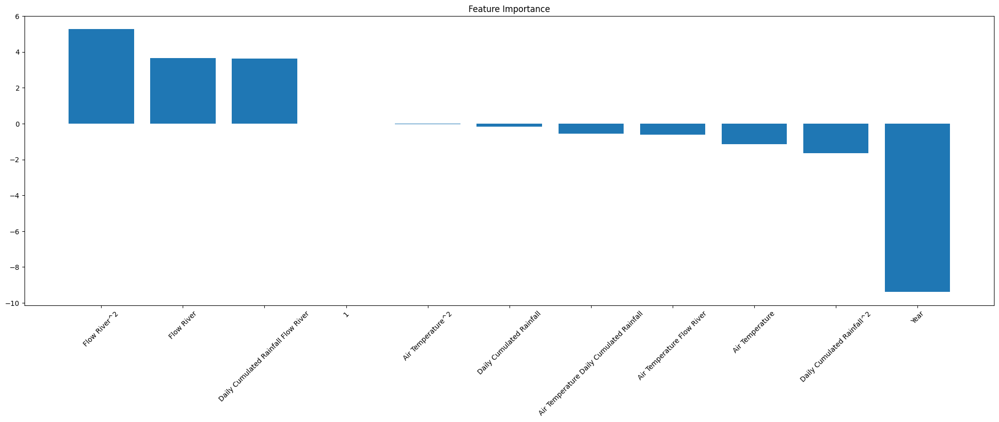

In [49]:
# show the importance of each feature in the model
feature_importance = pd.DataFrame()
feature_importance["feature"] = xgb_model.feature_names_in_
feature_importance["importance"] = -xgb_model.feature_importances_

feature_importance = feature_importance.sort_values(
    by="importance", ascending=False
)

# plot the importance of each feature
plt.figure(figsize=(25, 7.5))
plt.bar(
    x=feature_importance["feature"],
    height=feature_importance["importance"],
)

# rotate the x axis words by 45°
plt.xticks(rotation=45)

plt.title("Feature Importance")
plt.show()

### Predictions

In [50]:
mapie_cqr = MapieRegressor(xgb_model, cv="prefit", random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MapieRegressor(cv='prefit',
               estimator=XGBRegressor(base_score=None, booster='gblinear',
                                      callbacks=None, colsample_bylevel=None,
                                      colsample_bynode=None,
                                      colsample_bytree=None, device=None,
                                      early_stopping_rounds=None,
                                      enable_categorical=False,
                                      eta=0.0003789421387416474,
                                      eval_metric=None, feature_types=None,
                                      gamma=None, grow_policy=None,
                                      importance_type=None,
                                      interaction_constraints=None,
                                      learning_rate=0.013710817682972616,
                                      max_bin=None, max_cat_threshold=None,
                                      max_cat_to_onehot=None,
                                      max_delta_step=None, max_depth=None,
                                      max_leaves=None, min_child_weight=None,
                                      missing=nan, monotone_constraints=None,
                                      multi_strategy=None, n_estimators=333,
                                      n_jobs=None, num_parallel_tree=None, ...),
               method='base', random_state=42)

In [51]:
alpha = 0.1

# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


In [52]:
print(f"Coverage: {coverage_cqr}")

Coverage: 0.9696969696969697


#### Compute Measures

In [53]:
rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

print(f"RMSE: {rmse:.2f}")
print(f"R\u00b2: {r2:.2f}")

RMSE: 2.89
R²: 0.34


### Plots

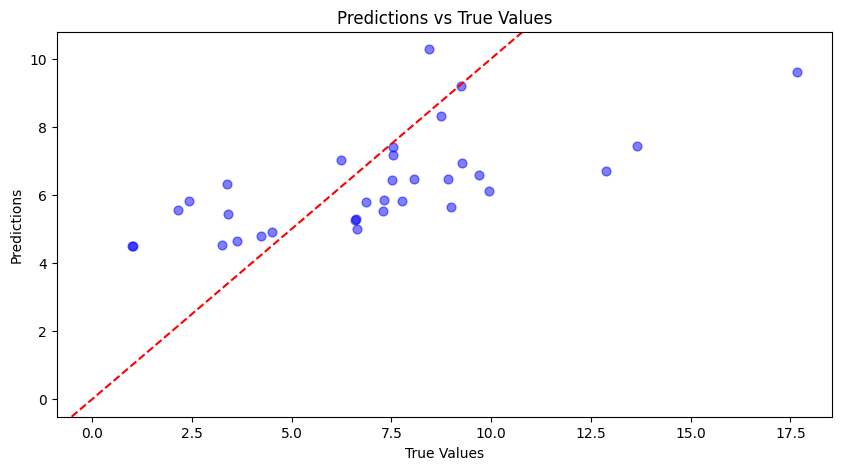

In [54]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

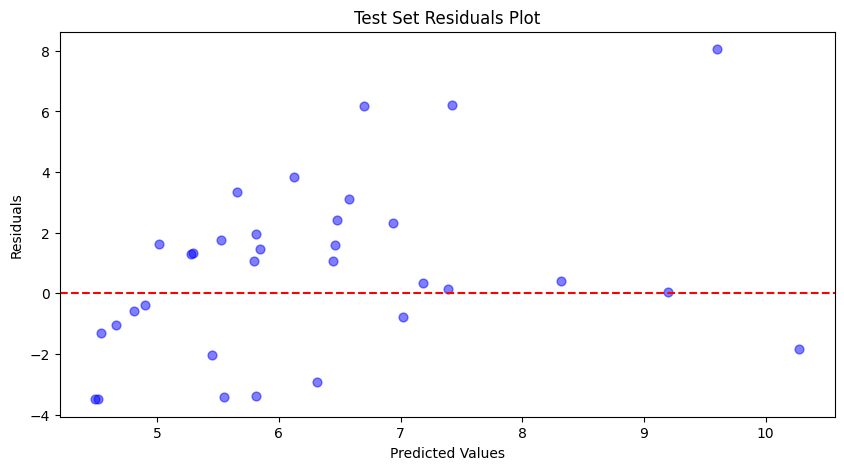

In [55]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

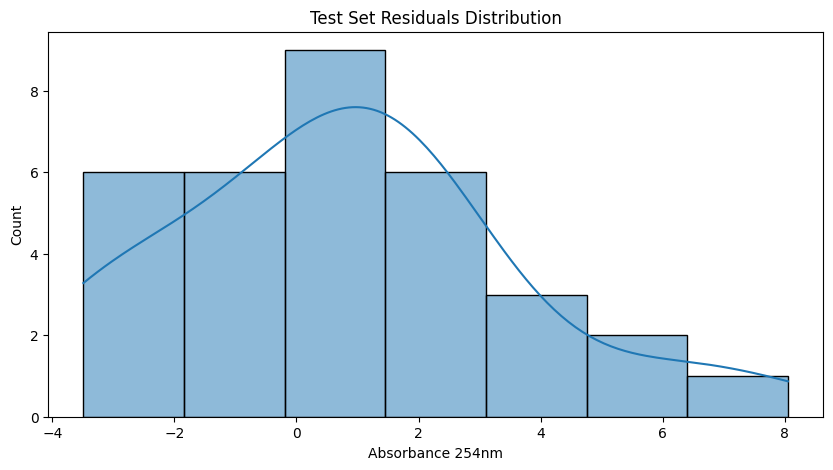

In [56]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [57]:
# get training residuals
train_predictions = xgb_model.predict(X_train_fit)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

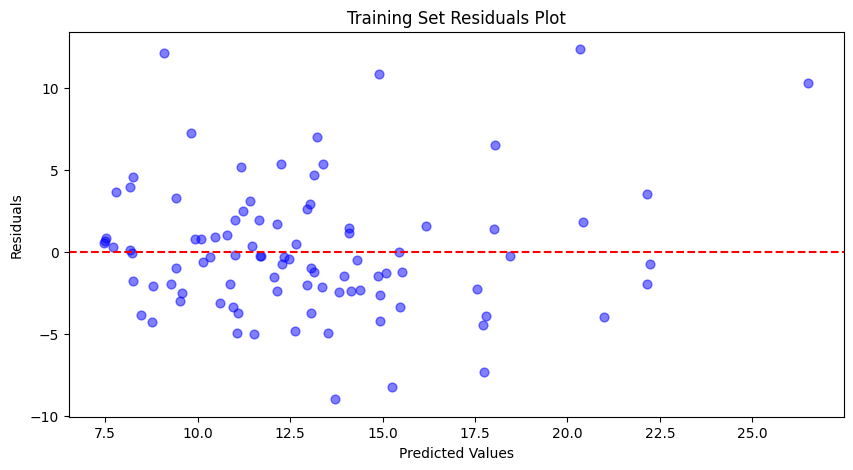

In [58]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(train_predictions, train_residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

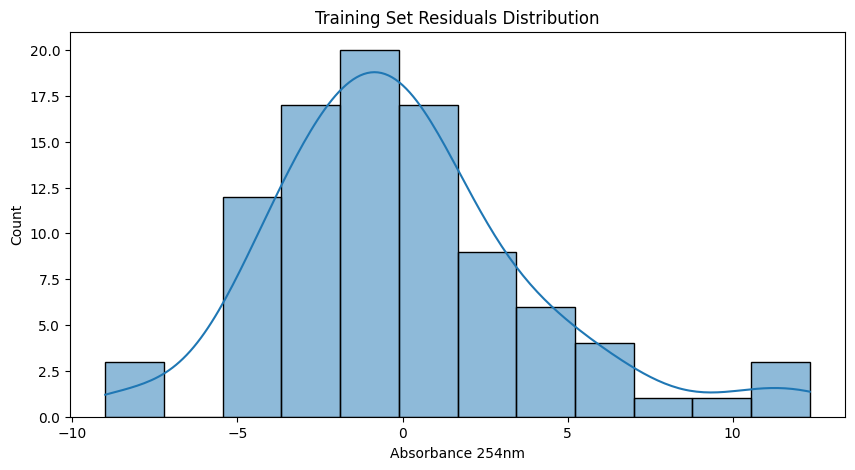

In [59]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

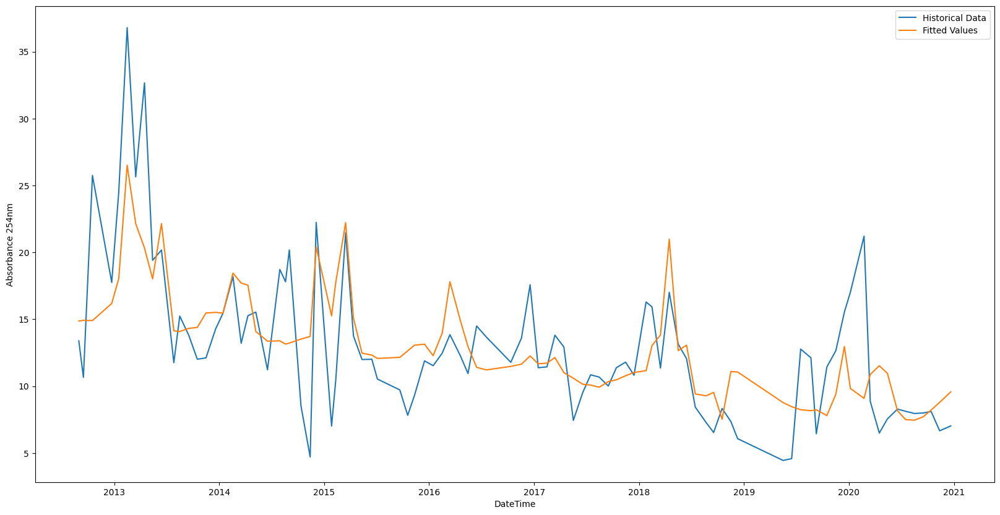

In [60]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"], y=train_predictions, label="Fitted Values"
)

plt.show()

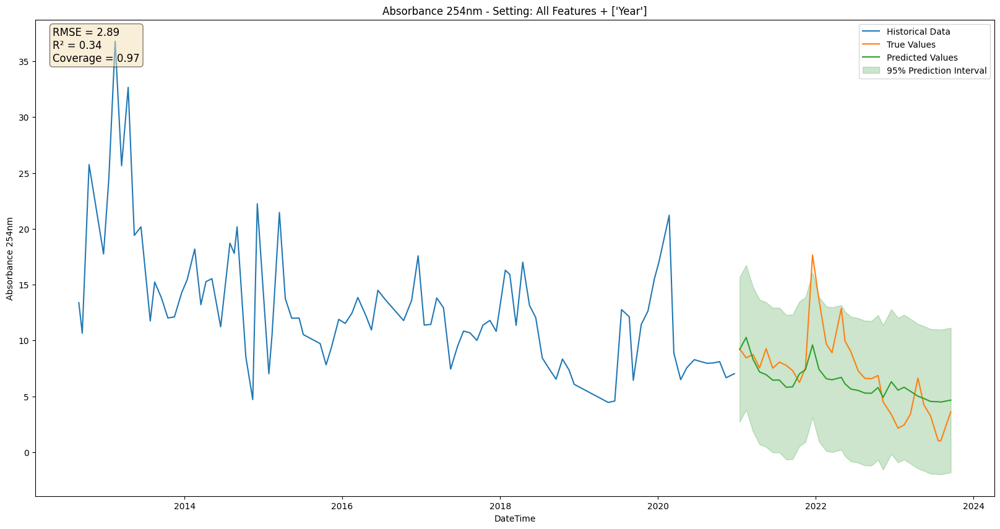

In [61]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(x=y_test["DateTime"], y=y_med, label="Predicted Values")
# plot std of predictions
plt.fill_between(
    y_test["DateTime"],
    y_lower,
    y2=y_upper,
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

Comment: prevede un trend crescente, probabilmente dato da qualche feature 

### Store Results

In [62]:
boost_pred = y_med
boost_lower_bound = y_lower
boost_upper_bound = y_upper
boost_rmse = rmse
boost_r2 = r2

# LightGBM (Random Forest with Linear Regressors on leaves)

### Split Data

In [63]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Season", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm", "Water Temperature"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [64]:
# add polynomial features
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(2)

X_poly = poly.fit_transform(
    X[X.columns.difference(["DateTime"] + further_features)]
)

X_poly = pd.DataFrame(
    X_poly,
    columns=poly.get_feature_names_out(
        X.columns.difference(["DateTime"] + further_features)
    ),
)

X_poly["DateTime"] = X["DateTime"].values

X_poly[further_features] = X[further_features].values

In [65]:
# split data such that 2022 and 2023 are test data
X_train = X_poly[X_poly["DateTime"] < "2021-01-01"]
X_test = X_poly[X_poly["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [66]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

In [67]:
# %%script false --no-raise-error
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2021-01-01"]
X_test = X[X["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [68]:
# %%script false --no-raise-error
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [69]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

#### Learning and Validation Curves

In [70]:
def learning_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    train_sizes=np.linspace(0.3, 1.0, 5),
):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator,
        X,
        y,
        train_sizes=train_sizes,
        cv=cv,
        scoring="neg_mean_squared_error",
    )

    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    validation_scores_mean = np.sqrt(
        -np.mean(validation_scores, axis=1)
    )
    validation_scores_std = np.sqrt(np.std(validation_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.plot(
        train_sizes,
        train_scores_mean,
        "o-",
        color="r",
        label="Training error",
    )
    plt.plot(
        train_sizes,
        validation_scores_mean,
        "o-",
        color="g",
        label="Validation error",
    )
    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes,
        validation_scores_mean - validation_scores_std,
        validation_scores_mean + validation_scores_std,
        alpha=0.1,
        color="g",
    )

    plt.rcParams["font.size"] = 10
    plt.ylabel("RMSE", fontsize=14)
    plt.xlabel("Training set size", fontsize=14)
    title = title
    plt.title(title, fontsize=18, y=1.03)
    plt.legend()
    plt.show()

In [71]:
def validation_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    param_name=None,
    param_range=None,
    fit_params=None,
):
    train_scores, test_scores = validation_curve(
        estimator,
        X,
        y,
        param_name=param_name,
        param_range=param_range,
        fit_params=fit_params,
        cv=cv,
        scoring="neg_mean_squared_error",  #'roc_auc'
        n_jobs=4,
    )
    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    test_scores_mean = np.sqrt(-np.mean(test_scores, axis=1))
    test_scores_std = np.sqrt(np.std(test_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.title(title, fontsize=20)
    plt.xlabel(param_name, fontsize=14)
    plt.ylabel("Score", fontsize=14)
    lw = 2
    plt.plot(
        param_range,
        train_scores_mean,
        label="Training score",
        color="darkorange",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.2,
        color="darkorange",
        lw=lw,
    )
    plt.plot(
        param_range,
        test_scores_mean,
        label="Cross-validation score",
        color="navy",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.2,
        color="navy",
        lw=lw,
    )
    plt.rcParams["font.size"] = 10
    plt.legend(loc="best")
    # plt.ylim(4, 8)
    plt.grid(visible=True)
    plt.show()

    # print param value with lowest test score
    print(
        f"{param_name} with lowest score:",
        param_range[np.argmin(test_scores_mean)],
    )

In [72]:
params_lgb = {
    "objective": "regression",
    "linear_tree": True,
    "random_state": 42,
}

In [73]:
model = LGBMRegressor(**params_lgb)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 22, number of used features: 0
[LightGBM] [Info] Start training from score 12.915934
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

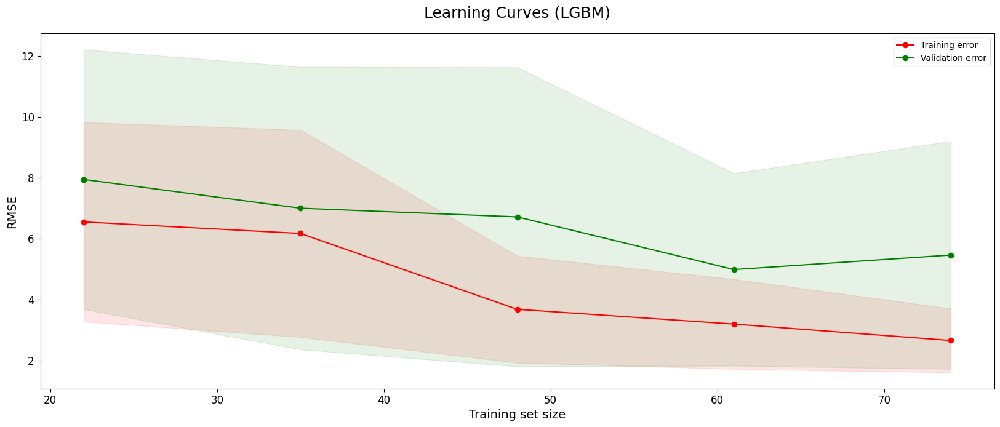

In [74]:
title = "Learning Curves (LGBM)"
learning_curves(
    model, title, X_train_fit, y_train_fit["Absorbance 254nm"], cv=5
)

In [75]:
param_name = "n_estimators"
param_range = np.arange(1, 100, 5)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_col_wise=true` to remove the overhead.[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_col_wise

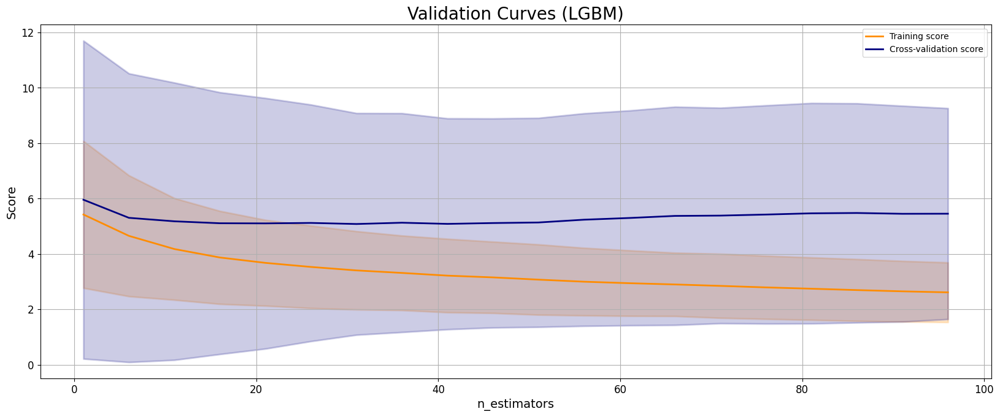

n_estimators with lowest score: 31


In [76]:
title = "Validation Curves (LGBM)"
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [77]:
param_name = "learning_rate"
param_range = np.logspace(-3, -1, 10)

In [78]:
np.logspace(-3, -1, 10)

array([0.001     , 0.0016681 , 0.00278256, 0.00464159, 0.00774264,
       0.0129155 , 0.02154435, 0.03593814, 0.05994843, 0.1       ])

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 4
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_col_w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

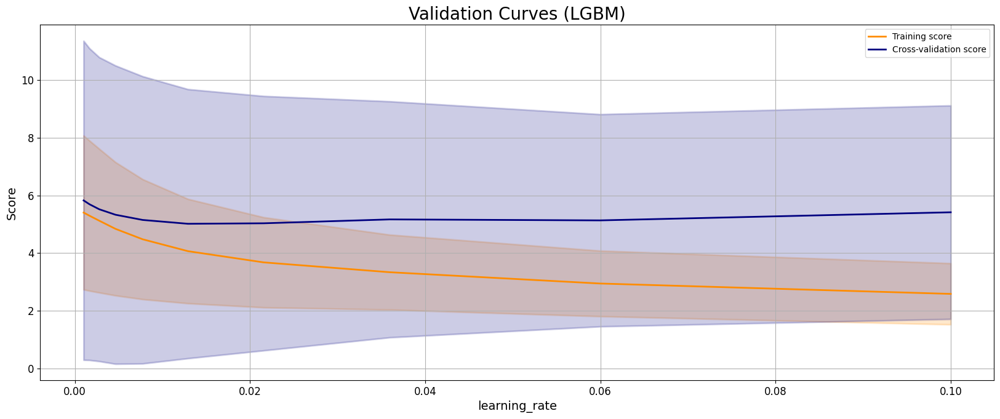

learning_rate with lowest score: 0.01291549665014884


In [79]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [80]:
param_name = "num_leaves"
param_range = np.arange(2, 50, 2)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 4
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 4
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

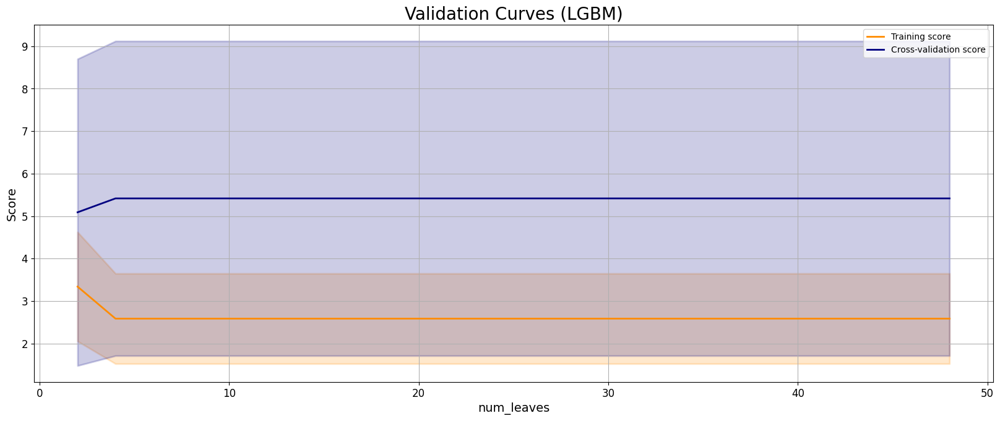

num_leaves with lowest score: 2


In [81]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [82]:
param_name = "lambda_l1"
param_range = np.logspace(-5, -1, 10)

[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Warning] lambda_l1 is set=2.782559402207126e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782559402207126e-05
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 4
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=2.782559402207126e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782559402207126e-05
[LightGBM] 

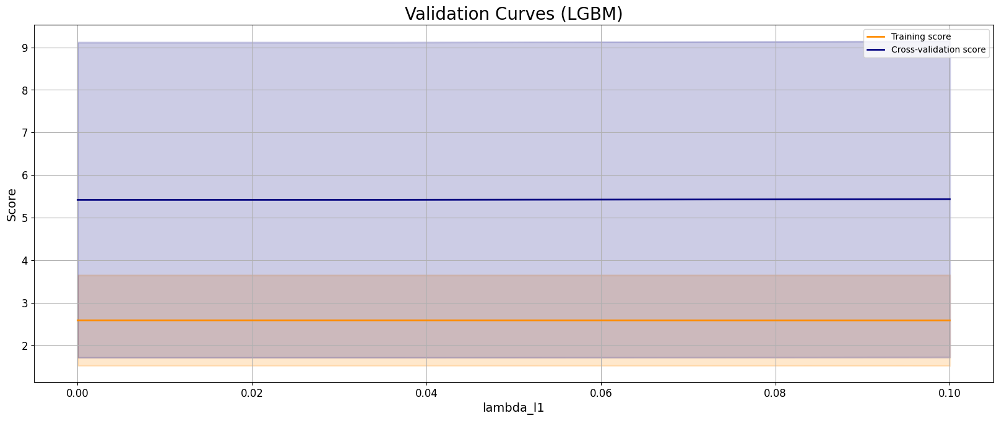

lambda_l1 with lowest score: 0.03593813663804626


In [83]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [84]:
param_name = "lambda_l2"
param_range = np.logspace(-5, -1, 10)

[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 4
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

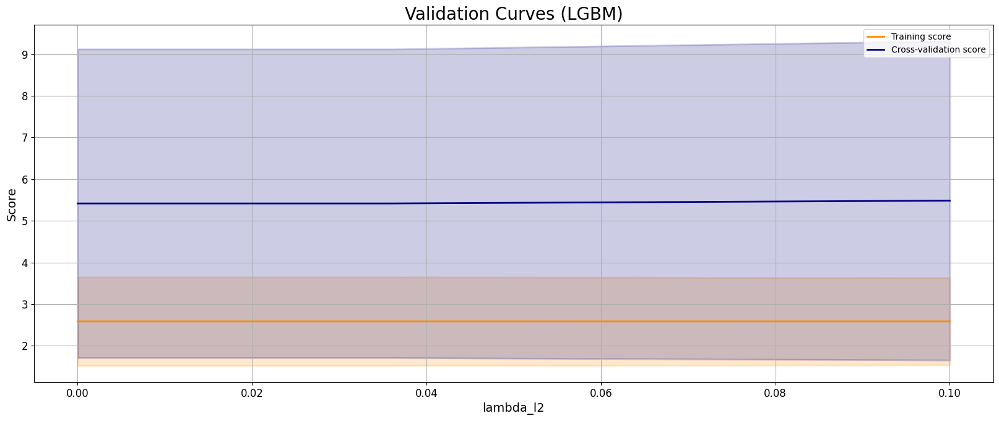

lambda_l2 with lowest score: 0.03593813663804626


In [85]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [86]:
param_name = "max_depth"
param_range = np.arange(2, 20, 1)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 4
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

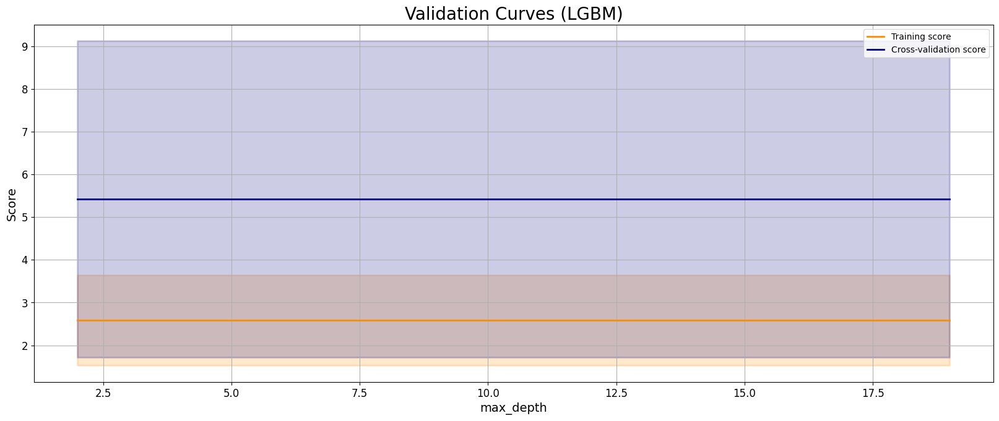

max_depth with lowest score: 2


In [87]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [88]:
param_name = "max_bin"
param_range = np.arange(2, 255, 5)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 4
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 28
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 4
[LightG

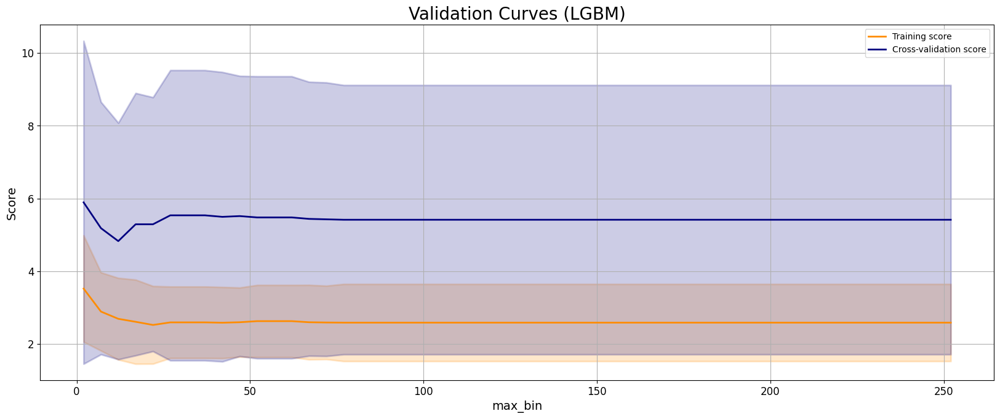

max_bin with lowest score: 12


In [89]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

#### Hyperparameter Tuning

In [90]:
def fit_and_validate_lgbm_model(
    X,
    y,
    train_index,
    val_index,
    params,
):
    X_tr, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
    y_tr, y_val = y.iloc[train_index], y.iloc[val_index]

    model = LGBMRegressor(
        objective="regression",
        random_state=42,
        linear_tree=True,
    )

    if params is not None:
        model.set_params(**params)

    # train model
    _ = model.fit(X_tr, y_tr)

    # obtain predictions
    y_val_pred = model.predict(X_val)

    # return metrics
    return mean_squared_error(y_val, y_val_pred, squared=False)

In [91]:
def objective(trial: optuna.trial.Trial) -> float:
    config = {
        "n_estimators": trial.suggest_int(
            "n_estimators", 1, 20, step=1
        ),
        "learning_rate": trial.suggest_float(
            "learning_rate", 1e-3, 1, log=True
        ),
        "max_depth": trial.suggest_int("max_depth", 2, 16, step=1),
        "num_leaves": trial.suggest_int("num_leaves", 2, 20, step=1),
        "min_data_in_leaf": trial.suggest_int(
            "min_data_in_leaf", 2, 50, step=1
        ),
        "lambda_l1": trial.suggest_float(
            "lambda_l1", 1e-3, 10, log=True
        ),
        "lambda_l2": trial.suggest_float(
            "lambda_l2", 1e-3, 10, log=True
        ),
        "min_split_gain": trial.suggest_float(
            "min_split_gain", 0, 15, step=0.5
        ),
        "subsample": trial.suggest_float("subsample", 0.1, 1),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 1e-3, 1, log=True
        ),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 1e-3, 1, log=True
        ),
        "min_child_samples": trial.suggest_int(
            "min_child_samples", 20, 1000, log=True
        ),
        "max_bin": trial.suggest_int("max_bin", 10, 500, step=10),
    }

    n_splits = 5
    cv = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    cv_mae = [None] * n_splits
    for i, (train_index, test_index) in enumerate(
        cv.split(X_train_fit, y_train_fit["Absorbance 254nm"])
    ):
        cv_mae[i] = fit_and_validate_lgbm_model(
            X_train_fit,
            y_train_fit["Absorbance 254nm"],
            train_index,
            test_index,
            config,
        )

    # saving the individual fold holdout metrics
    # uncomment this line if you don't want this
    trial.set_user_attr("split_mae", cv_mae)

    return np.mean(cv_mae)

In [92]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///LGBM.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(objective, n_trials=400, show_progress_bar=True)

[I 2024-04-11 01:48:57,515] A new study created in RDB with name: Hyperparameter Tuning - All Features + ['Year']


  0%|          | 0/400 [00:00<?, ?it/s]

[LightGBM] [Warning] lambda_l1 is set=0.0015789166091152026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015789166091152026
[LightGBM] [Warning] lambda_l2 is set=0.010750166328493339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010750166328493339
[LightGBM] [Warning] bagging_fraction is set=0.11680956167161666, subsample=0.23549508900301433 will be ignored. Current value: bagging_fraction=0.11680956167161666
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=148 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] feature_fraction is set=0.28534989243882714, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28534989243882714
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.0015789166091152026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015789166091152026
[LightGBM] [Warning] lambda_l2 is set=0.010750166328493339, 

In [93]:
study.best_params

{'n_estimators': 20,
 'learning_rate': 0.5146143867164246,
 'max_depth': 16,
 'num_leaves': 20,
 'min_data_in_leaf': 34,
 'lambda_l1': 0.0017009041499085164,
 'lambda_l2': 2.9824684556122176,
 'min_split_gain': 6.5,
 'subsample': 0.1142967846408639,
 'bagging_fraction': 0.004854667231197235,
 'feature_fraction': 0.00916733057655577,
 'min_child_samples': 53,
 'max_bin': 410}

In [94]:
params = study.best_params

# params['n_estimators'] = 20
params["max_bin"] = 30
params["learning_rate"] = 0.6
# params['lambda_l2'] = 1

In [95]:
%%script false --no-raise-error
params = {
    'n_estimators': 20,
    'learning_rate': 0.2355,
    'max_depth': 10,
    'num_leaves': 20,
    'min_data_in_leaf': 23,
    'lambda_l1': 0.12046319959934189,
    'lambda_l2': 0.0020380665600964157,
    'min_split_gain': 2.0,
    'subsample': 0.714993442284089,
    'bagging_fraction': 0.3723469453323971,
    'feature_fraction': 0.7631924074906202,
    'min_child_samples': 870,
    'max_bin': 365
}

#### Train model with mapie

In [96]:
alpha = 0.1
lgbm_model = LGBMRegressor(
    objective="regression", random_state=42, linear_tree=True, **params
)

lgbm_model.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

[LightGBM] [Warning] lambda_l1 is set=0.0017009041499085164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017009041499085164
[LightGBM] [Warning] lambda_l2 is set=2.9824684556122176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9824684556122176
[LightGBM] [Warning] bagging_fraction is set=0.004854667231197235, subsample=0.1142967846408639 will be ignored. Current value: bagging_fraction=0.004854667231197235
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.00916733057655577, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.00916733057655577
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.0017009041499085164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017009041499085164
[LightGBM] [Warning] lambda_l2 is set=2.9824684556122176, reg_la

LGBMRegressor(bagging_fraction=0.004854667231197235,
              feature_fraction=0.00916733057655577,
              lambda_l1=0.0017009041499085164, lambda_l2=2.9824684556122176,
              learning_rate=0.6, linear_tree=True, max_bin=30, max_depth=16,
              min_child_samples=53, min_data_in_leaf=34, min_split_gain=6.5,
              n_estimators=20, num_leaves=20, objective='regression',
              random_state=42, subsample=0.1142967846408639)

In [97]:
# Calibrate uncertainties on calibration set
mapie_cqr = MapieRegressor(lgbm_model, cv="prefit", random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

[LightGBM] [Warning] lambda_l1 is set=0.0017009041499085164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017009041499085164
[LightGBM] [Warning] lambda_l2 is set=2.9824684556122176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9824684556122176
[LightGBM] [Warning] bagging_fraction is set=0.004854667231197235, subsample=0.1142967846408639 will be ignored. Current value: bagging_fraction=0.004854667231197235
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.00916733057655577, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.00916733057655577


MapieRegressor(cv='prefit',
               estimator=LGBMRegressor(bagging_fraction=0.004854667231197235,
                                       feature_fraction=0.00916733057655577,
                                       lambda_l1=0.0017009041499085164,
                                       lambda_l2=2.9824684556122176,
                                       learning_rate=0.6, linear_tree=True,
                                       max_bin=30, max_depth=16,
                                       min_child_samples=53,
                                       min_data_in_leaf=34, min_split_gain=6.5,
                                       n_estimators=20, num_leaves=20,
                                       objective='regression', random_state=42,
                                       subsample=0.1142967846408639),
               method='base', random_state=42)

### Feature Importance

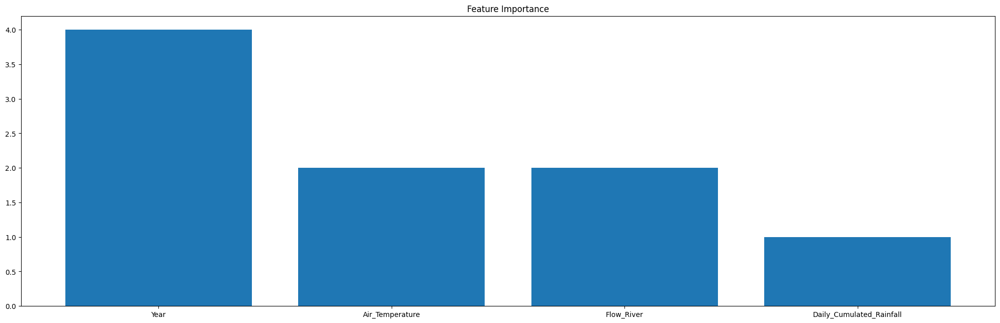

In [98]:
# show the importance of each feature in the model
feature_importance = pd.DataFrame()
feature_importance["feature"] = lgbm_model.feature_name_
feature_importance["importance"] = lgbm_model.feature_importances_

feature_importance = feature_importance.sort_values(
    by="importance", ascending=False
)

# plot the importance of each feature
plt.figure(figsize=(25, 7.5))
plt.bar(
    x=feature_importance["feature"],
    height=feature_importance["importance"],
)
plt.title("Feature Importance")
plt.show()

### Predictions

In [99]:
# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

[LightGBM] [Warning] lambda_l1 is set=0.0017009041499085164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017009041499085164
[LightGBM] [Warning] lambda_l2 is set=2.9824684556122176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9824684556122176
[LightGBM] [Warning] bagging_fraction is set=0.004854667231197235, subsample=0.1142967846408639 will be ignored. Current value: bagging_fraction=0.004854667231197235
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.00916733057655577, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.00916733057655577


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


In [100]:
print("Coverage:", coverage_cqr)

Coverage: 0.9393939393939394


#### Compute Measures

In [101]:
rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

print(f"RMSE: {rmse:.4f}")
print(f"R\u00b2: {r2:.4f}")

RMSE: 3.0956
R²: 0.2405


### Plots

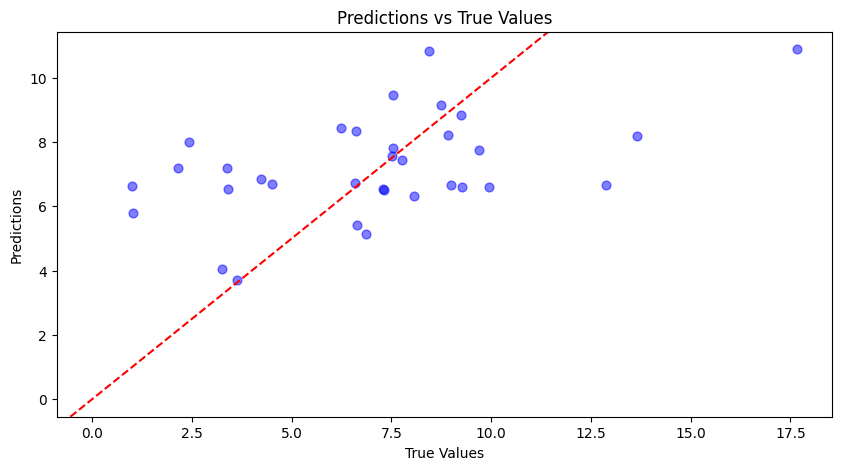

In [102]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

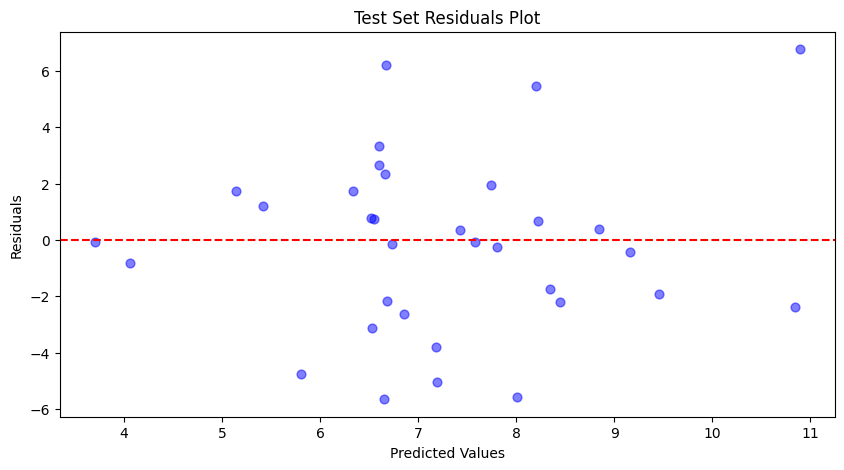

In [103]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

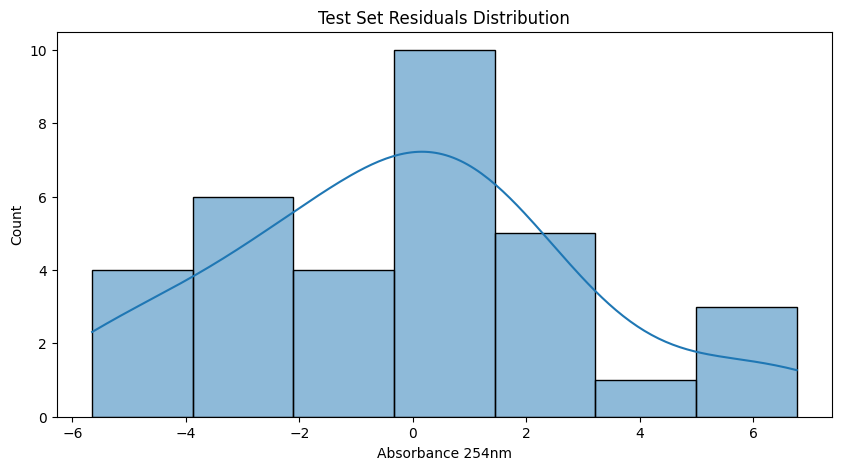

In [104]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [105]:
# get training residuals
train_predictions, _ = mapie_cqr.predict(X_train_fit, alpha=alpha)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

[LightGBM] [Warning] lambda_l1 is set=0.0017009041499085164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017009041499085164
[LightGBM] [Warning] lambda_l2 is set=2.9824684556122176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9824684556122176
[LightGBM] [Warning] bagging_fraction is set=0.004854667231197235, subsample=0.1142967846408639 will be ignored. Current value: bagging_fraction=0.004854667231197235
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.00916733057655577, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.00916733057655577


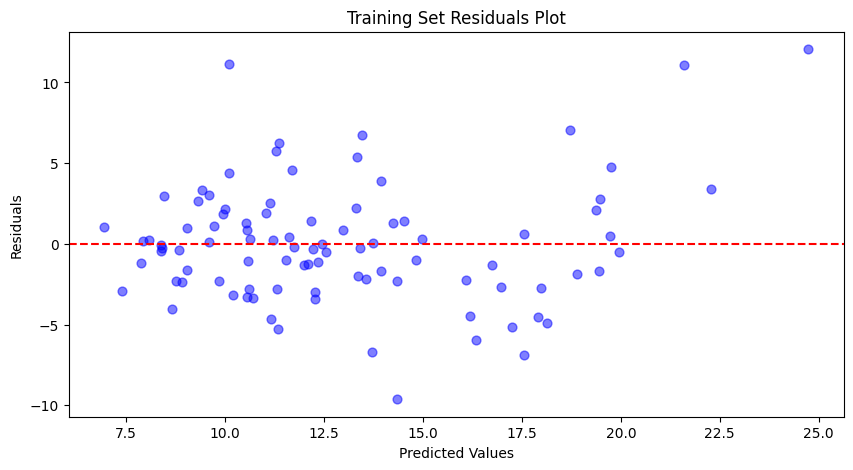

In [106]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(train_predictions, train_residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

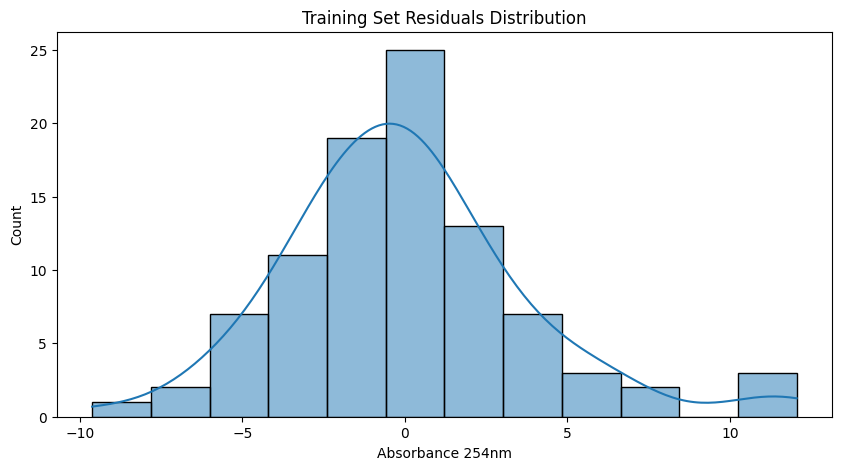

In [107]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

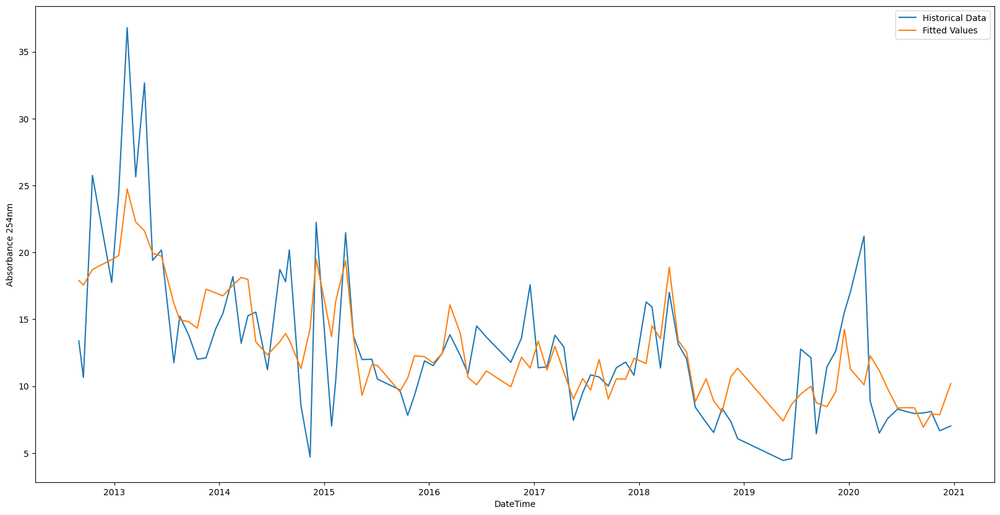

In [108]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=train_predictions,
    label="Fitted Values",
)

plt.show()

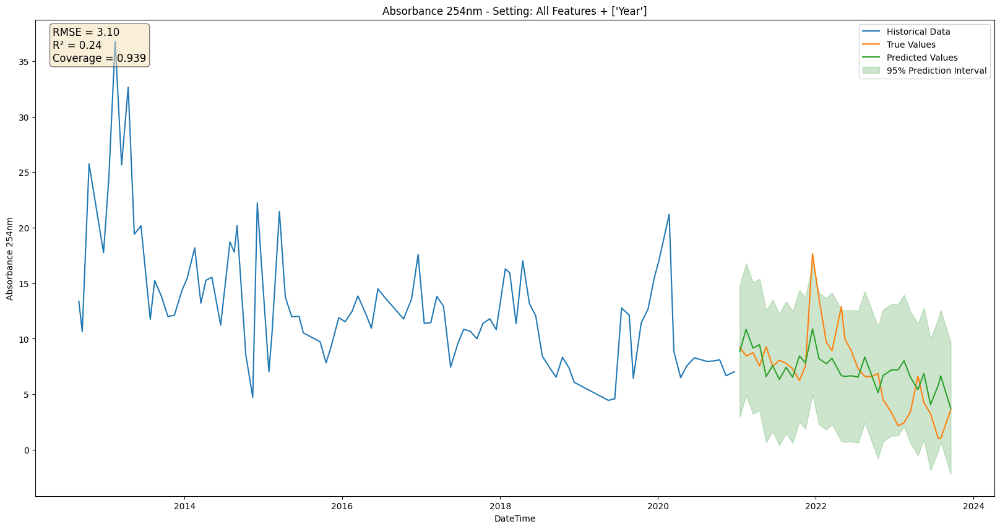

In [109]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test_fit["DateTime"],
    y=y_test_fit["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test_fit["DateTime"], y=y_med, label="Predicted Values"
)
# plot std of predictions
plt.fill_between(
    y_test_fit["DateTime"],
    y_lower.flatten(),
    y2=y_upper.flatten(),
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.3f}",
    )
)

plt.text(
    y_train_fit["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

Comment: prevede un trend crescente, probabilmente dato da qualche feature 

### Store Results

In [110]:
lgbm_pred = y_med
lgbm_lower_bound = y_lower
lgbm_upper_bound = y_upper
lgbm_rmse = rmse
lgbm_r2 = r2

# Neural Network

## Split Data

In [111]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Season", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm", "Water Temperature"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [112]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2021-01-01"]
X_test = X[X["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [113]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [114]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

## Train the model

### Hyperparameter Tuning

In [115]:
def fit_and_validate_nn_model(
    X,
    y,
    train_index,
    val_index,
    params,
):
    X_tr, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
    y_tr, y_val = y.iloc[train_index], y.iloc[val_index]

    model = MLPRegressor(
        random_state=42,
        hidden_layer_sizes=tuple(params["layers"]),
        max_iter=1000,
    )

    param = params.copy()
    param.pop("layers")
    model.set_params(**param)

    # train model
    _ = model.fit(X_tr, y_tr)

    # obtain predictions
    y_val_pred = model.predict(X_val)

    # return metrics
    return mean_squared_error(y_val, y_val_pred, squared=False)

In [116]:
def objective(trial: optuna.trial.Trial) -> float:
    config = {
        "layers": [
            trial.suggest_int(f"n_units_{i}", 50, 100, step=5)
            for i in range(trial.suggest_int("n_layers", 2, 2))
        ],
        "activation": trial.suggest_categorical(
            "activation", ["identity", "logistic", "tanh", "relu"]
        ),
        "solver": trial.suggest_categorical("solver", ["sgd", "adam"]),
        "alpha": trial.suggest_float("alpha", 1e-5, 1),
        "learning_rate": trial.suggest_categorical(
            "learning_rate", ["constant", "invscaling", "adaptive"]
        ),
        "power_t": trial.suggest_float("power_t", 0.1, 1),
        "beta_1": trial.suggest_float("beta_1", 0.1, 1),
        "beta_2": trial.suggest_float("beta_2", 0.1, 1),
        "epsilon": trial.suggest_float("epsilon", 1e-8, 1),
        "early_stopping": True,
    }

    n_splits = 5
    cv = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    cv_mae = [None] * n_splits
    for i, (train_index, test_index) in enumerate(
        cv.split(X_train_fit, y_train_fit["Absorbance 254nm"])
    ):
        cv_mae[i] = fit_and_validate_nn_model(
            X_train_fit,
            y_train_fit["Absorbance 254nm"],
            train_index,
            test_index,
            config,
        )

    # saving the individual fold holdout metrics
    # uncomment this line if you don't want this
    trial.set_user_attr("split_mae", cv_mae)

    return np.mean(cv_mae)

In [117]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///NeuralNetwork.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(objective, n_trials=100, show_progress_bar=True)

[I 2024-04-11 01:49:50,498] A new study created in RDB with name: Hyperparameter Tuning - All Features + ['Year']


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2024-04-11 01:49:50,726] Trial 0 finished with value: 4.941605792486868 and parameters: {'n_layers': 2, 'n_units_0': 50, 'n_units_1': 85, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.7777674620294182, 'learning_rate': 'invscaling', 'power_t': 0.23132451188803999, 'beta_1': 0.723789325259023, 'beta_2': 0.5541056476812128, 'epsilon': 0.180884501581376}. Best is trial 0 with value: 4.941605792486868.
[I 2024-04-11 01:49:50,892] Trial 1 finished with value: 5.0126950256997755 and parameters: {'n_layers': 2, 'n_units_0': 100, 'n_units_1': 90, 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.18475290019687846, 'learning_rate': 'constant', 'power_t': 0.15263450805168713, 'beta_1': 0.7292844349375786, 'beta_2': 0.5647310600828428, 'epsilon': 0.22774092506028024}. Best is trial 0 with value: 4.941605792486868.
[I 2024-04-11 01:49:51,068] Trial 2 finished with value: 4.678210235787157 and parameters: {'n_layers': 2, 'n_units_0': 95, 'n_units_1': 60, 'activation': 'relu', 'solver': '

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


[I 2024-04-11 01:50:02,649] Trial 20 finished with value: 4.651788255264108 and parameters: {'n_layers': 2, 'n_units_0': 80, 'n_units_1': 80, 'activation': 'tanh', 'solver': 'adam', 'alpha': 0.02989414912935641, 'learning_rate': 'constant', 'power_t': 0.5390586935186423, 'beta_1': 0.7281651234231961, 'beta_2': 0.3800956607540289, 'epsilon': 0.5031215537081132}. Best is trial 17 with value: 4.377575978155596.
[I 2024-04-11 01:50:03,173] Trial 21 finished with value: 4.442796611440052 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 75, 'activation': 'identity', 'solver': 'adam', 'alpha': 0.001415731442220812, 'learning_rate': 'adaptive', 'power_t': 0.5752038346722657, 'beta_1': 0.6050986582280266, 'beta_2': 0.3759896056290196, 'epsilon': 0.2755637844277985}. Best is trial 17 with value: 4.377575978155596.
[I 2024-04-11 01:50:03,635] Trial 22 finished with value: 4.372484538724638 and parameters: {'n_layers': 2, 'n_units_0': 70, 'n_units_1': 80, 'activation': 'identity', 'so

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


[I 2024-04-11 01:50:11,223] Trial 30 finished with value: 5.449003569718757 and parameters: {'n_layers': 2, 'n_units_0': 60, 'n_units_1': 95, 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.34493200744408886, 'learning_rate': 'adaptive', 'power_t': 0.3023416726707106, 'beta_1': 0.7624250984125027, 'beta_2': 0.5112970357674242, 'epsilon': 0.23028368635642177}. Best is trial 27 with value: 4.330955235438513.
[I 2024-04-11 01:50:11,700] Trial 31 finished with value: 4.389676370831042 and parameters: {'n_layers': 2, 'n_units_0': 70, 'n_units_1': 80, 'activation': 'identity', 'solver': 'adam', 'alpha': 0.07741588562505028, 'learning_rate': 'adaptive', 'power_t': 0.4817579585320767, 'beta_1': 0.6599572868892285, 'beta_2': 0.4281300974605023, 'epsilon': 0.19094826915699784}. Best is trial 27 with value: 4.330955235438513.
[I 2024-04-11 01:50:12,129] Trial 32 finished with value: 4.4013482299802265 and parameters: {'n_layers': 2, 'n_units_0': 60, 'n_units_1': 80, 'activation': 'identity

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-ch

[I 2024-04-11 01:50:18,625] Trial 40 finished with value: 11.337936323746115 and parameters: {'n_layers': 2, 'n_units_0': 55, 'n_units_1': 75, 'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.20278155933743752, 'learning_rate': 'invscaling', 'power_t': 0.6728758800391165, 'beta_1': 0.7039044604564944, 'beta_2': 0.4912356163350807, 'epsilon': 0.782351942411322}. Best is trial 27 with value: 4.330955235438513.
[I 2024-04-11 01:50:18,966] Trial 41 finished with value: 4.393801066400837 and parameters: {'n_layers': 2, 'n_units_0': 70, 'n_units_1': 80, 'activation': 'identity', 'solver': 'adam', 'alpha': 0.11204360823559137, 'learning_rate': 'adaptive', 'power_t': 0.48403702200095244, 'beta_1': 0.6611744100528159, 'beta_2': 0.43476932365437326, 'epsilon': 0.19927875765745295}. Best is trial 27 with value: 4.330955235438513.
[I 2024-04-11 01:50:19,341] Trial 42 finished with value: 4.5602480552053954 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 85, 'activation': 'identity',

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-ch

[I 2024-04-11 01:50:43,054] Trial 89 finished with value: 12.764624410450843 and parameters: {'n_layers': 2, 'n_units_0': 95, 'n_units_1': 75, 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.3806723331399099, 'learning_rate': 'invscaling', 'power_t': 0.7319635713868676, 'beta_1': 0.44768064675799674, 'beta_2': 0.9348747554600502, 'epsilon': 0.0409289757159048}. Best is trial 80 with value: 4.064642582684605.
[I 2024-04-11 01:50:44,169] Trial 90 finished with value: 4.446996354974085 and parameters: {'n_layers': 2, 'n_units_0': 90, 'n_units_1': 80, 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.2970346248490844, 'learning_rate': 'adaptive', 'power_t': 0.8910462696557149, 'beta_1': 0.4927253093186826, 'beta_2': 0.9735111209875329, 'epsilon': 0.12819565465899374}. Best is trial 80 with value: 4.064642582684605.
[I 2024-04-11 01:50:44,898] Trial 91 finished with value: 4.064762119451062 and parameters: {'n_layers': 2, 'n_units_0': 95, 'n_units_1': 80, 'activation': 'relu', 'solver': '

In [118]:
study.best_params

{'n_layers': 2,
 'n_units_0': 95,
 'n_units_1': 80,
 'activation': 'relu',
 'solver': 'sgd',
 'alpha': 0.40606958425296347,
 'learning_rate': 'adaptive',
 'power_t': 0.757528641525456,
 'beta_1': 0.4023871838259946,
 'beta_2': 0.9433456590807309,
 'epsilon': 0.001821195723399019}

In [119]:
params = study.best_params.copy()
params["n_units_1"] = 80
# params['learning_rate'] = 'invscaling'
params["activation"] = "identity"

hidden_layer_sizes = [
    params[f"n_units_{i}"] for i in range(params["n_layers"])
]

for i in range(params["n_layers"]):
    params.pop(f"n_units_{i}")

params.pop("n_layers")

2

#### Train model with mapie

In [120]:
alpha = 0.1
mlp_model = MLPRegressor(
    random_state=42,
    hidden_layer_sizes=hidden_layer_sizes,
    max_iter=1000,
    early_stopping=True,
    **params
)

mlp_model.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MLPRegressor(activation='identity', alpha=0.40606958425296347,
             beta_1=0.4023871838259946, beta_2=0.9433456590807309,
             early_stopping=True, epsilon=0.001821195723399019,
             hidden_layer_sizes=[95, 80], learning_rate='adaptive',
             max_iter=1000, power_t=0.757528641525456, random_state=42,
             solver='sgd')

In [121]:
# Calibrate uncertainties on calibration set
mapie_cqr = MapieRegressor(mlp_model, cv="prefit", random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MapieRegressor(cv='prefit',
               estimator=MLPRegressor(activation='identity',
                                      alpha=0.40606958425296347,
                                      beta_1=0.4023871838259946,
                                      beta_2=0.9433456590807309,
                                      early_stopping=True,
                                      epsilon=0.001821195723399019,
                                      hidden_layer_sizes=[95, 80],
                                      learning_rate='adaptive', max_iter=1000,
                                      power_t=0.757528641525456,
                                      random_state=42, solver='sgd'),
               method='base', random_state=42)

## Prediction

In [122]:
# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


In [123]:
print("Coverage:", coverage_cqr)

Coverage: 0.9393939393939394


#### Compute Measures

In [124]:
rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

print(f"RMSE: {rmse:.4f}")
print(f"R\u00b2: {r2:.4f}")

RMSE: 3.1352
R²: 0.2209


## Plots

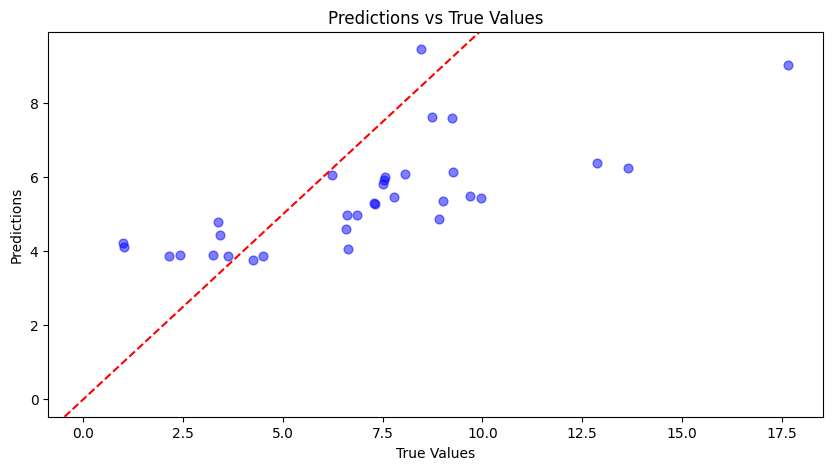

In [125]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

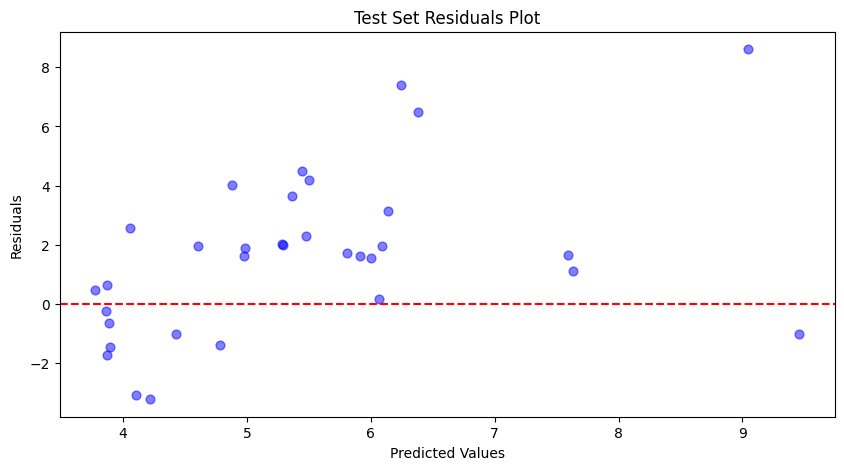

In [126]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

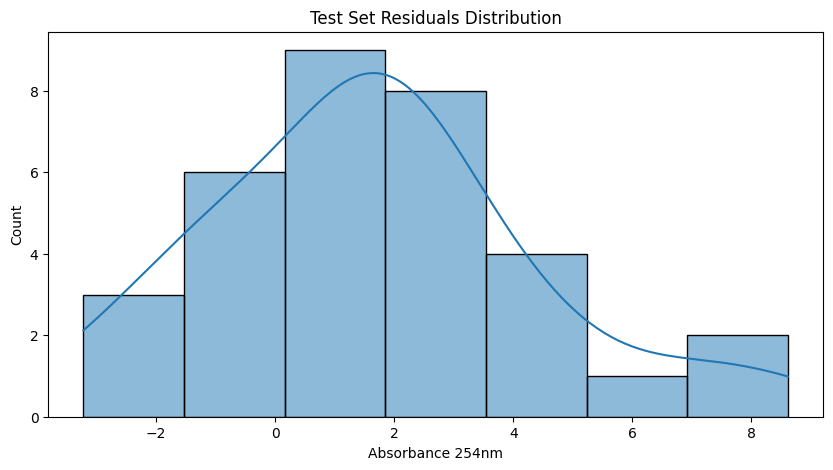

In [127]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [128]:
# get training residuals
train_predictions, _ = mapie_cqr.predict(X_train_fit, alpha=alpha)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

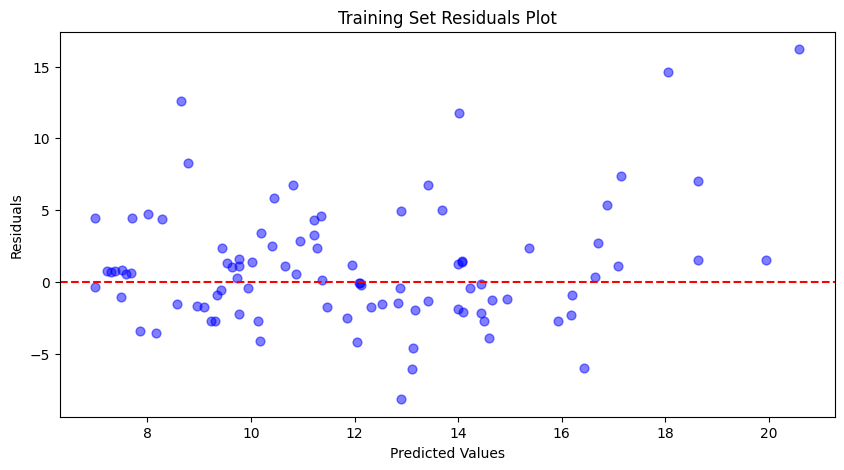

In [129]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(
    train_predictions.flatten(), train_residuals, c="b", s=40, alpha=0.5
)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

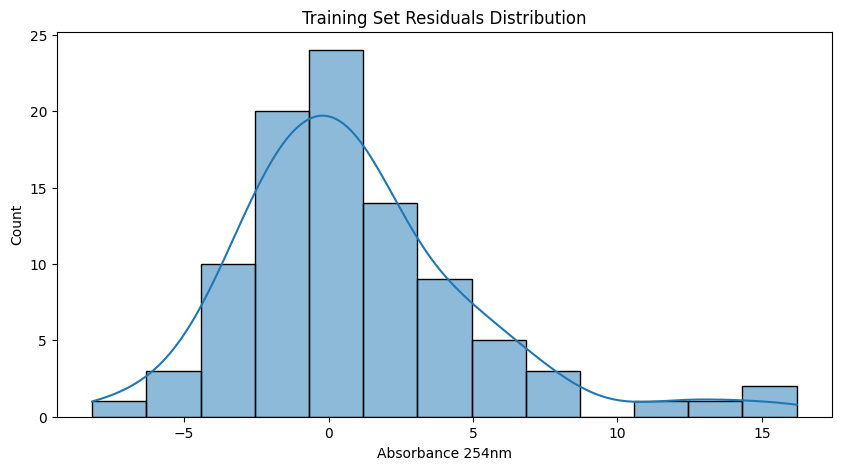

In [130]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

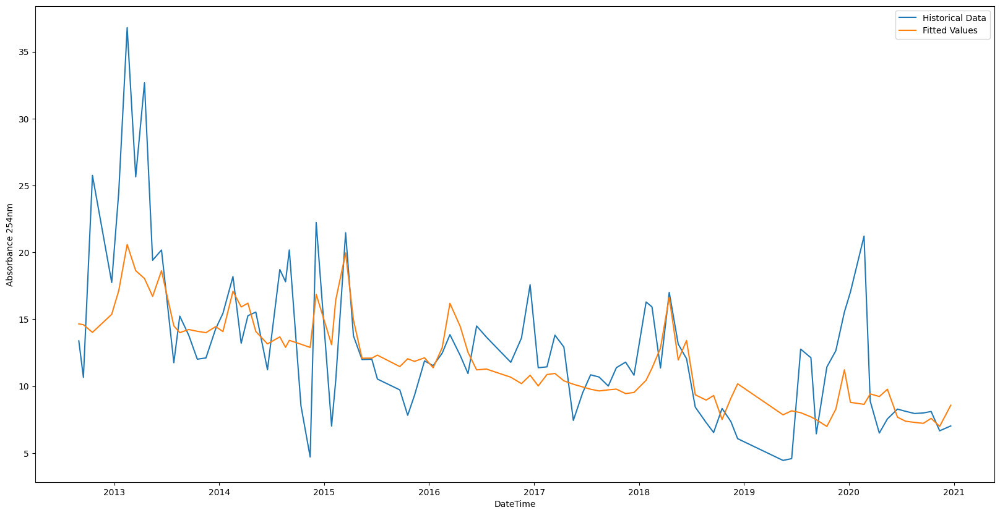

In [131]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=train_predictions,
    label="Fitted Values",
)

plt.show()

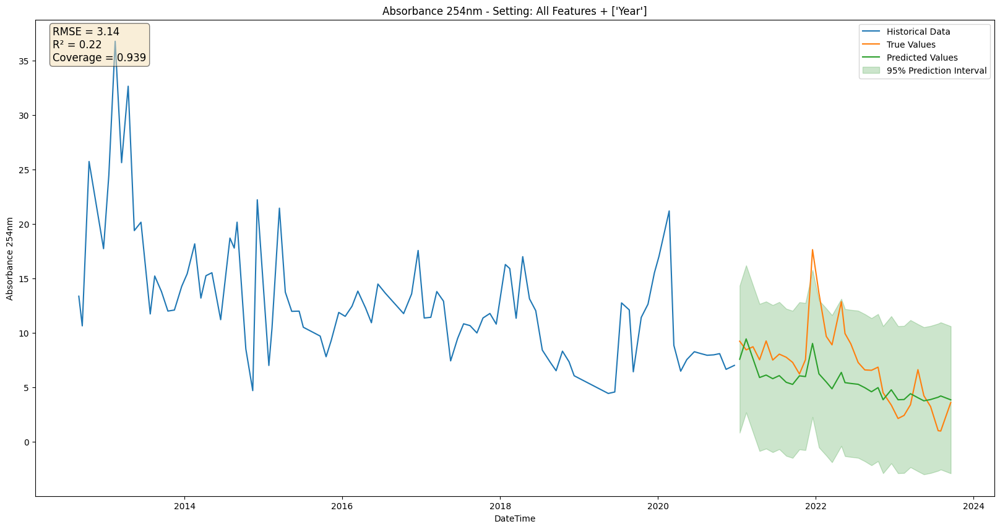

In [132]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test_fit["DateTime"],
    y=y_test_fit["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test_fit["DateTime"], y=y_med, label="Predicted Values"
)
# plot std of predictions
plt.fill_between(
    y_test_fit["DateTime"],
    y_lower.flatten(),
    y2=y_upper.flatten(),
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.3f}",
    )
)

plt.text(
    y_train_fit["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

## Store Results

In [133]:
nn_pred = y_med
nn_lower_bound = y_lower
nn_upper_bound = y_upper
nn_rmse = rmse
nn_r2 = r2

# Projections

## Load Input Projections

In [137]:
air_temp_rcp45_df = pd.read_excel(os.path.join(interpolated_projections_folder, 'air_temp_rcp45.xlsx'))
air_temp_rcp85_df = pd.read_excel(os.path.join(interpolated_projections_folder, 'air_temp_rcp85.xlsx'))

rain_rcp45_df = 